In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
import os
print(os.path.exists("C:\\Users\\user\\Downloads\\Dataset .csv"))

True


In [11]:
df = pd.read_csv("C:\\Users\\user\\Downloads\\Dataset .csv")

In [13]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [15]:
num_rows, num_columns = df.shape
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}") 

Number of Rows: 9551
Number of Columns: 21


In [17]:
# Check for missing values
missing_values = df.isnull().sum()
print("Missing values per column:\n", missing_values)

Missing values per column:
 Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [19]:
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

In [21]:
print(df['Has Table booking'].value_counts(dropna=False))
print(df['Has Online delivery'].value_counts(dropna=False))

Has Table booking
No     8393
Yes    1158
Name: count, dtype: int64
Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64


In [23]:
df['Has Table booking'] = df['Has Table booking'].fillna('no')
df['Has Online delivery'] = df['Has Online delivery'].fillna('no')

In [32]:
df['Has Table booking'] = df['Has Table booking'].map({'yes': 1, 'no': 0})
df['Has Online delivery'] = df['Has Online delivery'].map({'yes': 1, 'no': 0})
print(df[['Has Table booking', 'Has Online delivery']].head(10))

   Has Table booking  Has Online delivery
0                NaN                  NaN
1                NaN                  NaN
2                NaN                  NaN
3                NaN                  NaN
4                NaN                  NaN
5                NaN                  NaN
6                NaN                  NaN
7                NaN                  NaN
8                NaN                  NaN
9                NaN                  NaN


In [34]:
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


In [36]:
df["Aggregate rating"].describe()

count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64

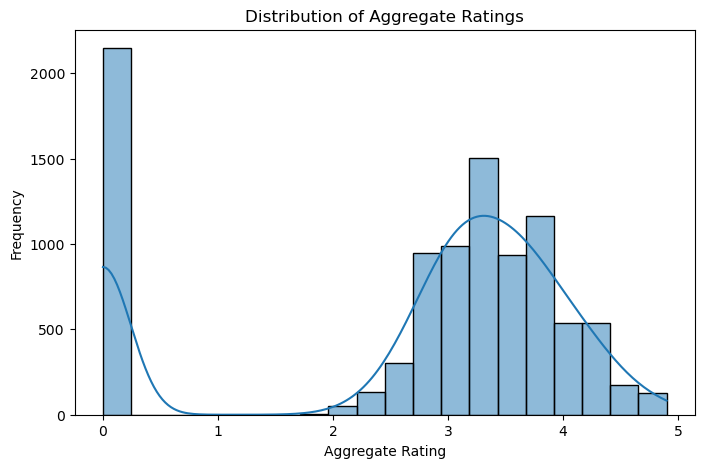

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.histplot(df["Aggregate rating"], bins=20, kde=True)
plt.xlabel("Aggregate Rating")
plt.ylabel("Frequency")
plt.title("Distribution of Aggregate Ratings")
plt.show()

In [41]:
rating_counts = df["Aggregate rating"].value_counts()
print("Rating Counts:\n", rating_counts)

Rating Counts:
 Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64


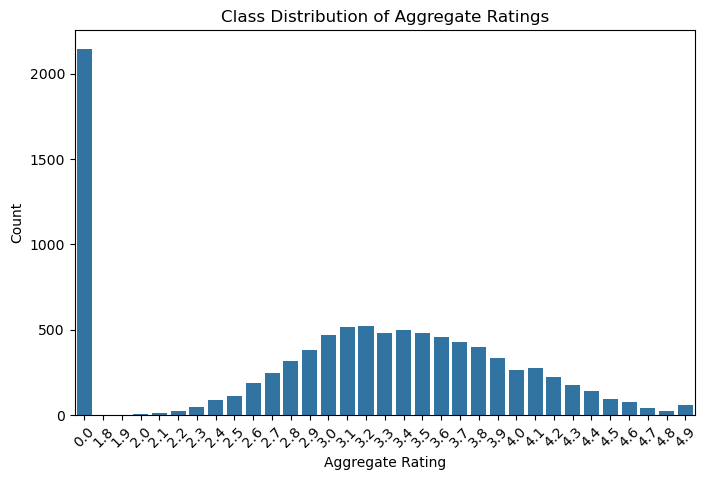

In [44]:
plt.figure(figsize=(8, 5))
sns.barplot(x=rating_counts.index, y=rating_counts.values)
plt.xlabel("Aggregate Rating")
plt.ylabel("Count")
plt.title("Class Distribution of Aggregate Ratings")
plt.xticks(rotation=45)
plt.show()

In [46]:
df.describe

<bound method NDFrame.describe of       Restaurant ID           Restaurant Name  Country Code              City  \
0           6317637          Le Petit Souffle           162       Makati City   
1           6304287          Izakaya Kikufuji           162       Makati City   
2           6300002    Heat - Edsa Shangri-La           162  Mandaluyong City   
3           6318506                      Ooma           162  Mandaluyong City   
4           6314302               Sambo Kojin           162  Mandaluyong City   
...             ...                       ...           ...               ...   
9546        5915730               Naml۱ Gurme           208         ��stanbul   
9547        5908749              Ceviz A��ac۱           208         ��stanbul   
9548        5915807                     Huqqa           208         ��stanbul   
9549        5916112               A���k Kahve           208         ��stanbul   
9550        5927402  Walter's Coffee Roastery           208         ��stanb

In [48]:
mean_values = df.mean(numeric_only=True)
median_values = df.median(numeric_only=True)
std_dev_values = df.std(numeric_only=True)
# Display the results
print("Mean Values:\n", mean_values)
print("\nMedian Values:\n", median_values)
print("\nStandard Deviation Values:\n", std_dev_values)

Mean Values:
 Restaurant ID           9.051128e+06
Country Code            1.836562e+01
Longitude               6.412657e+01
Latitude                2.585438e+01
Average Cost for two    1.199211e+03
Has Table booking                NaN
Has Online delivery              NaN
Price range             1.804837e+00
Aggregate rating        2.666370e+00
Votes                   1.569097e+02
dtype: float64

Median Values:
 Restaurant ID           6.004089e+06
Country Code            1.000000e+00
Longitude               7.719196e+01
Latitude                2.857047e+01
Average Cost for two    4.000000e+02
Has Table booking                NaN
Has Online delivery              NaN
Price range             2.000000e+00
Aggregate rating        3.200000e+00
Votes                   3.100000e+01
dtype: float64

Standard Deviation Values:
 Restaurant ID           8.791521e+06
Country Code            5.675055e+01
Longitude               4.146706e+01
Latitude                1.100794e+01
Average Cost for two  

In [50]:
df.columns = df.columns.str.strip()  

Top 10 Countries with Most Restaurants:

 Country Code  Number of Restaurants
            1                   8652
          216                    434
          215                     80
           30                     60
          214                     60
          189                     60
          148                     40
          208                     34
           14                     24
          162                     22


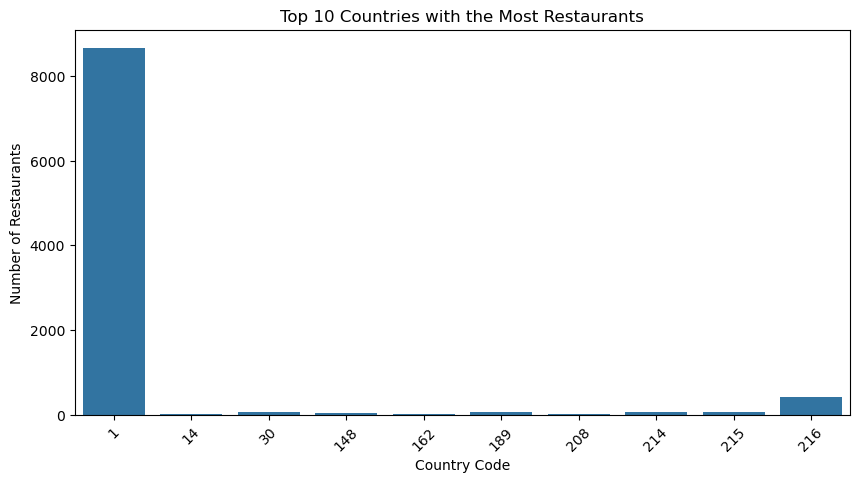

In [52]:
# Count restaurants per country
country_counts = df["Country Code"].value_counts().reset_index()
country_counts.columns = ["Country Code", "Number of Restaurants"]

# Display the top 10 countries in table format
print("Top 10 Countries with Most Restaurants:\n")
print(country_counts.head(10).to_string(index=False))

# Plot the bar chart
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.barplot(x=country_counts["Country Code"][:10], y=country_counts["Number of Restaurants"][:10])

plt.xlabel("Country Code")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Countries with the Most Restaurants")
plt.xticks(rotation=45)
plt.show()


Top 10 Cities with Most Restaurants:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


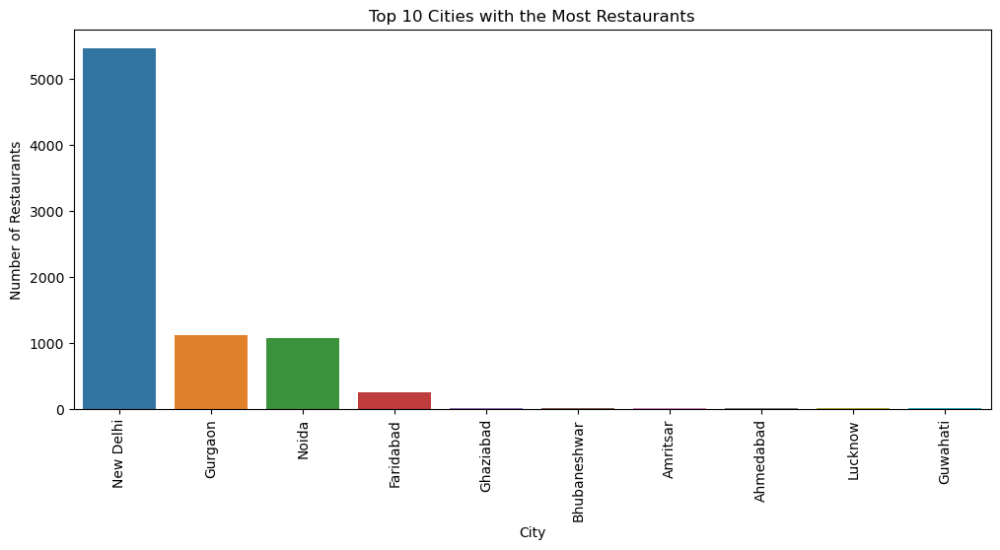

In [54]:
#Distribution of "City" (Top Cities with Most Restaurants)
import matplotlib.pyplot as plt
import seaborn as sns

# Count restaurants per city
city_counts = df["City"].value_counts()

# Display the top 10 cities
print("Top 10 Cities with Most Restaurants:\n", city_counts.head(10))
plt.figure(figsize=(12, 5))
sns.barplot(x=city_counts.index[:10], y=city_counts.values[:10], hue=city_counts.index[:10], dodge=False)

plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Cities with the Most Restaurants")
plt.xticks(rotation=90)
plt.legend([],[], frameon=False) 
plt.show()


Top 10 Most Popular Cuisines:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


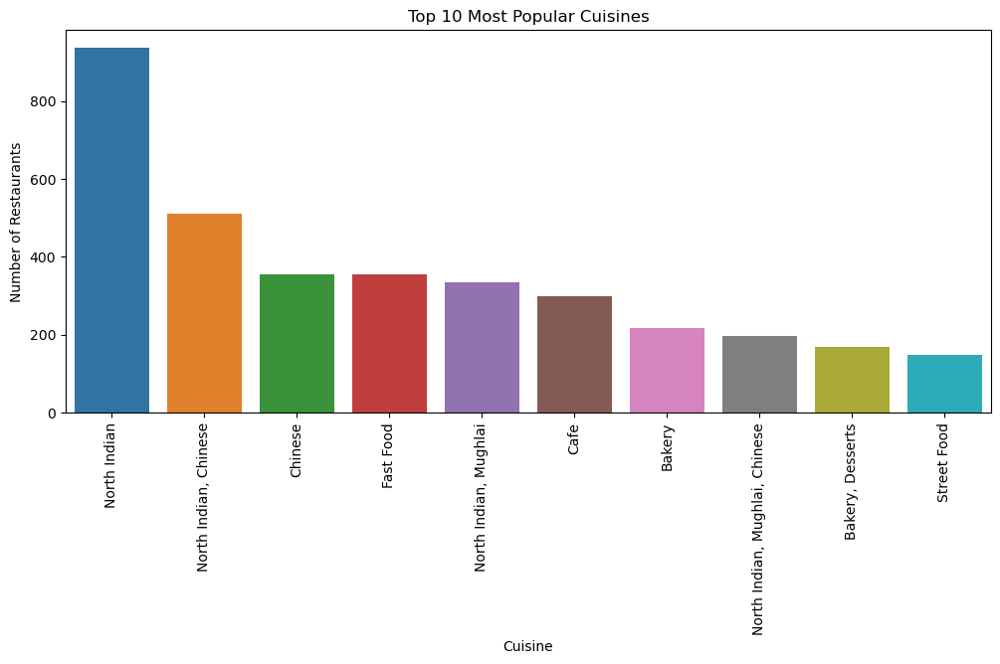

In [55]:
 #Distribution of "Cuisines" (Top Cuisines Offered)
import matplotlib.pyplot as plt
import seaborn as sns

# Count the most common cuisines
cuisine_counts = df["Cuisines"].value_counts()

# Display the top 10 cuisines
print("Top 10 Most Popular Cuisines:\n", cuisine_counts.head(10))

plt.figure(figsize=(12, 5))
sns.barplot(x=cuisine_counts.index[:10], y=cuisine_counts.values[:10], hue=cuisine_counts.index[:10], dodge=False)

plt.xlabel("Cuisine")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Most Popular Cuisines")
plt.xticks(rotation=90)
plt.legend([],[], frameon=False)  
plt.show()


In [56]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [58]:
import folium
import pandas as pd

In [60]:
import pandas as pd
df = pd.read_csv("C:\\Users\\user\\Downloads\\Dataset .csv") 
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


In [61]:
import folium

# Create a base map centered at the mean latitude and longitude
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add restaurant markers
for index, row in df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=row["Restaurant Name"],  
        icon=folium.Icon(color="blue", icon="cutlery", prefix="fa")
    ).add_to(restaurant_map)

# Save and display the map
restaurant_map.save("restaurant_locations.html")
restaurant_map


Top 10 Countries with Most Restaurants:
 Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
Name: count, dtype: int64


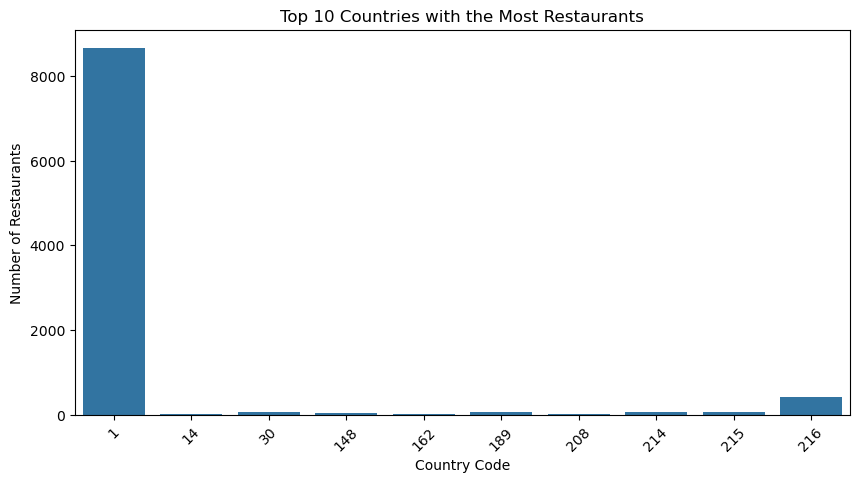

In [62]:
import matplotlib.pyplot as plt  
import seaborn as sns  

# Count the number of restaurants in each country
country_counts = df["Country Code"].value_counts()
        
# Display top 10 countries
print("Top 10 Countries with Most Restaurants:\n", country_counts.head(10))

# Bar plot of restaurant distribution across countries
plt.figure(figsize=(10, 5))
sns.barplot(x=country_counts.index[:10], y=country_counts.values[:10])

plt.xlabel("Country Code")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Countries with the Most Restaurants")
plt.xticks(rotation=45)
plt.show()

In [81]:
# Calculate average rating for each city
city_ratings = df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False)

# Check the output
print(city_ratings.head(10))

City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Tagaytay City       4.500000
Secunderabad        4.500000
Name: Aggregate rating, dtype: float64


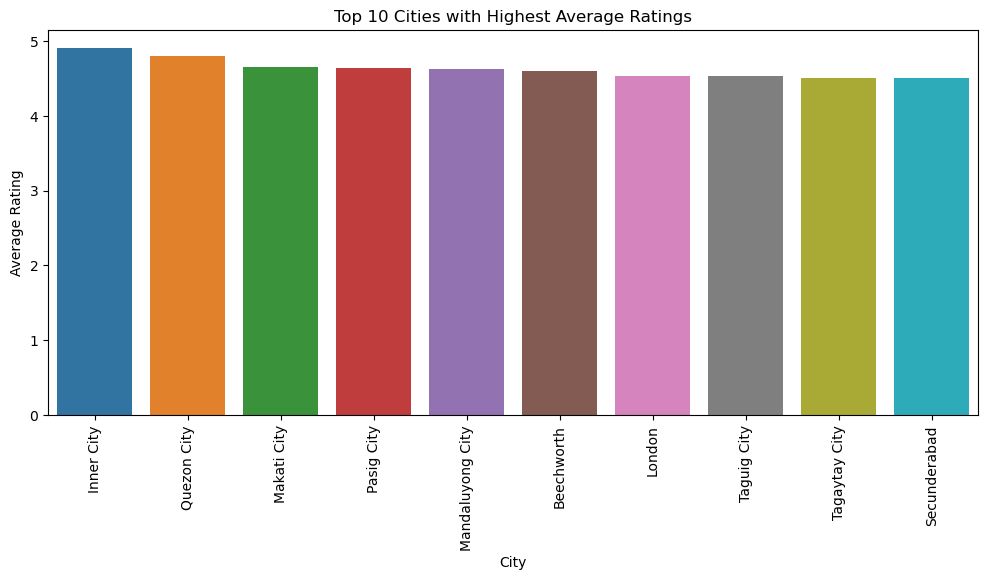

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

# Bar plot of average ratings per city
plt.figure(figsize=(12, 5))

sns.barplot(x=city_ratings.index[:10], y=city_ratings.values[:10], hue=city_ratings.index[:10], dodge=False)

plt.xlabel("City")
plt.ylabel("Average Rating")
plt.title("Top 10 Cities with Highest Average Ratings")
plt.xticks(rotation=90)
plt.legend([],[], frameon=False) 
plt.show()

Top 10 Countries with Highest Average Ratings:
 Country Code
162    4.468182
208    4.300000
94     4.295238
148    4.262500
214    4.233333
189    4.210000
215    4.087500
166    4.060000
216    4.004378
191    3.870000
Name: Aggregate rating, dtype: float64


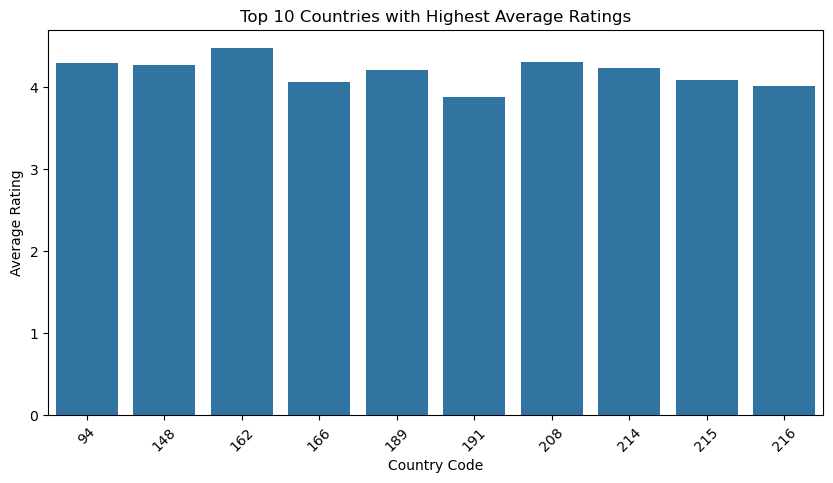

In [85]:
# Calculate average rating for each country
country_ratings = df.groupby("Country Code")["Aggregate rating"].mean().sort_values(ascending=False)

# Display top 10 countries with highest average ratings
print("Top 10 Countries with Highest Average Ratings:\n", country_ratings.head(10))

# Bar plot of average ratings per country
plt.figure(figsize=(10, 5))
sns.barplot(x=country_ratings.index[:10], y=country_ratings.values[:10])

plt.xlabel("Country Code")
plt.ylabel("Average Rating")
plt.title("Top 10 Countries with Highest Average Ratings")
plt.xticks(rotation=45)
plt.show()


Correlation Matrix:
                   Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


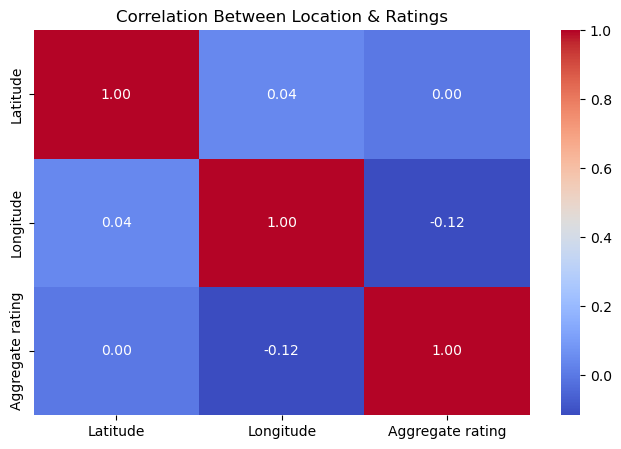

In [87]:
# Check correlation between Longitude, Latitude, and Ratings
correlation_matrix = df[["Latitude", "Longitude", "Aggregate rating"]].corr()

print("Correlation Matrix:\n", correlation_matrix)

# Heatmap to visualize correlation
plt.figure(figsize=(8, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between Location & Ratings")
plt.show()

In [89]:
#Task 2
# Count restaurants offering table booking
table_booking_counts = df["Has Table booking"].value_counts()
print("Table Booking Availability:\n", table_booking_counts)

# Count restaurants offering online delivery
online_delivery_counts = df["Has Online delivery"].value_counts()
print("\nOnline Delivery Availability:\n", online_delivery_counts)

Table Booking Availability:
 Has Table booking
No     8393
Yes    1158
Name: count, dtype: int64

Online Delivery Availability:
 Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64


In [91]:
df["Has Table booking"] = df["Has Table booking"].map({"Yes": 1, "No": 0}).astype(int)
df["Has Online delivery"] = df["Has Online delivery"].map({"Yes": 1, "No": 0}).astype(int)
print(df[["Has Table booking", "Has Online delivery"]].dtypes)

Has Table booking      int32
Has Online delivery    int32
dtype: object


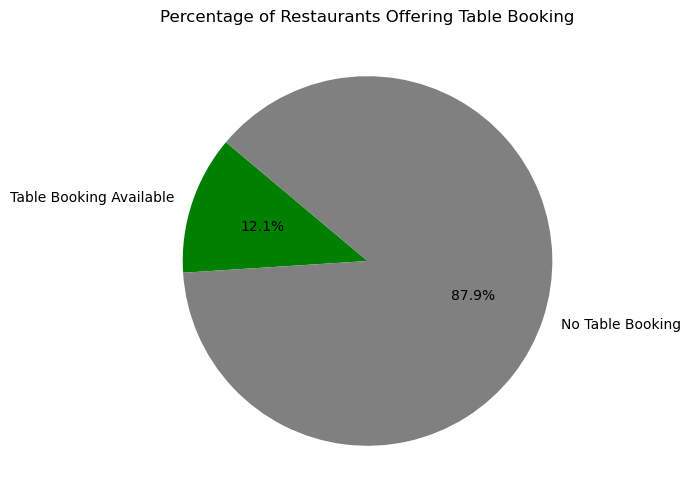

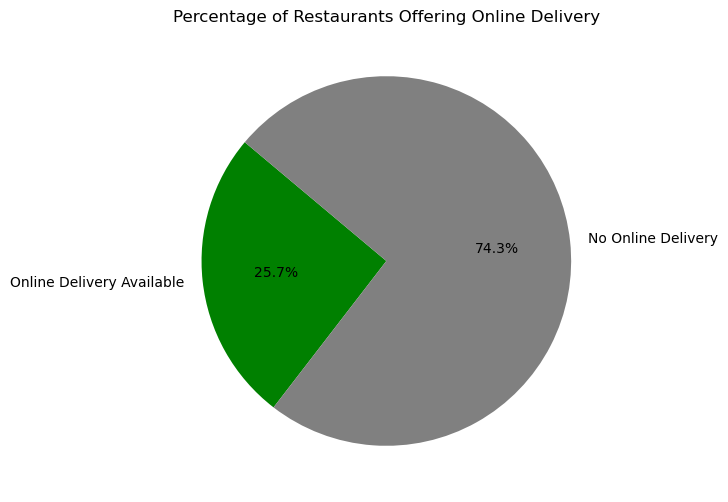

In [103]:
import matplotlib.pyplot as plt

# Data for Table Booking
labels_tb = ["Table Booking Available", "No Table Booking"]
sizes_tb = [table_booking_percentage, 100 - table_booking_percentage]
colors_tb = ["green", "grey"]

plt.figure(figsize=(6, 6))
plt.pie(sizes_tb, labels=labels_tb, autopct="%1.1f%%", colors=colors_tb, startangle=140)
plt.title("Percentage of Restaurants Offering Table Booking")
plt.show()

# Data for Online Delivery
labels_od = ["Online Delivery Available", "No Online Delivery"]
sizes_od = [online_delivery_percentage, 100 - online_delivery_percentage]
colors_od = ["green", "grey"]

plt.figure(figsize=(6, 6))
plt.pie(sizes_od, labels=labels_od, autopct="%1.1f%%", colors=colors_od, startangle=140)
plt.title("Percentage of Restaurants Offering Online Delivery")
plt.show()


In [109]:
# Count number of restaurants in each price range
price_range_counts = df["Price range"].value_counts().sort_index()
print("Number of Restaurants in Each Price Range:\n", price_range_counts)

Number of Restaurants in Each Price Range:
 Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64


In [111]:
# Calculate average rating for each price range
price_range_ratings = df.groupby("Price range")["Aggregate rating"].mean()
print("Average Ratings for Each Price Range:\n", price_range_ratings)

Average Ratings for Each Price Range:
 Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


In [69]:
# Calculate average rating for restaurants with and without table booking
table_booking_ratings = df.groupby("Has Table booking")["Aggregate rating"].mean()

# Display the results
print("Average Ratings for Table Booking:")
print(table_booking_ratings)

Average Ratings for Table Booking:
Has Table booking
0    2.559359
1    3.441969
Name: Aggregate rating, dtype: float64


In [117]:
# Calculate average rating for restaurants with and without table booking
table_booking_ratings = df.groupby("Has Table booking")["Aggregate rating"].mean()
print(table_booking_ratings)

Has Table booking
0    2.559359
1    3.441969
Name: Aggregate rating, dtype: float64


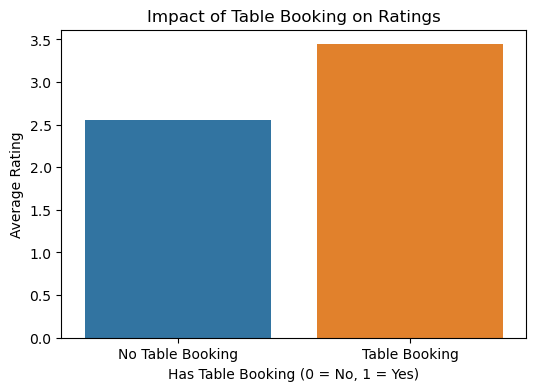

In [119]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.barplot(x=table_booking_ratings.index, y=table_booking_ratings.values, hue=table_booking_ratings.index, dodge=False)
plt.xlabel("Has Table Booking (0 = No, 1 = Yes)")
plt.ylabel("Average Rating")
plt.title("Impact of Table Booking on Ratings")
plt.xticks([0, 1], ["No Table Booking", "Table Booking"])
plt.legend([],[], frameon=False) 
plt.show() 

In [121]:
# Count restaurants with and without online delivery for each price range
online_delivery_by_price = df.groupby("Price range")["Has Online delivery"].value_counts().unstack()

# Display the results
print("Online Delivery Availability Across Price Ranges:\n", online_delivery_by_price)

Online Delivery Availability Across Price Ranges:
 Has Online delivery     0     1
Price range                    
1                    3743   701
2                    1827  1286
3                     997   411
4                     533    53


<Figure size 800x500 with 0 Axes>

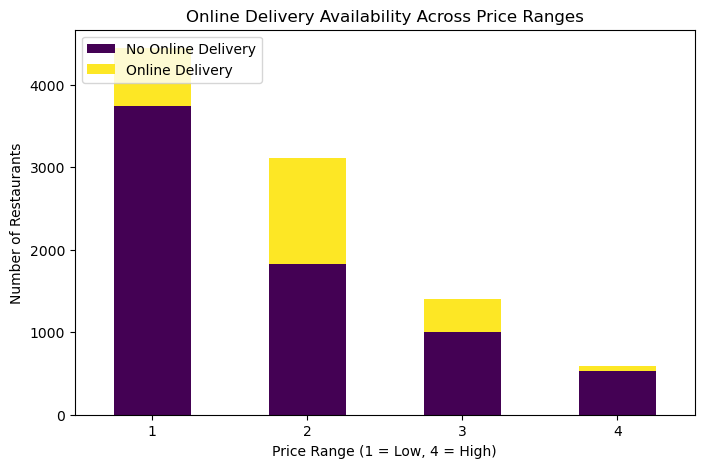

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))

# Stacked bar plot to compare online delivery across price ranges
online_delivery_by_price.plot(kind="bar", stacked=True, colormap="viridis", figsize=(8,5))

plt.xlabel("Price Range (1 = Low, 4 = High)")
plt.ylabel("Number of Restaurants")
plt.title("Online Delivery Availability Across Price Ranges")
plt.legend(["No Online Delivery", "Online Delivery"], loc="upper left")
plt.xticks(rotation=0)
plt.show()

In [125]:
#Task 2
# Count the number of restaurants in each price range
price_range_counts = df["Price range"].value_counts().sort_index()

# Display the most common price range
most_common_price_range = price_range_counts.idxmax()
print(f"The most common price range is: {most_common_price_range}")
print("\nNumber of Restaurants in Each Price Range:\n", price_range_counts)

The most common price range is: 1

Number of Restaurants in Each Price Range:
 Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64


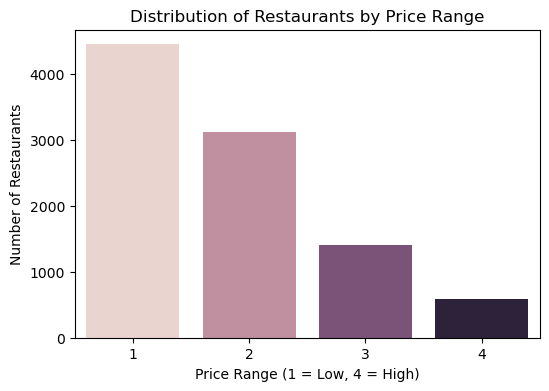

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.barplot(x=price_range_counts.index, y=price_range_counts.values, hue=price_range_counts.index, dodge=False)
plt.xlabel("Price Range (1 = Low, 4 = High)")
plt.ylabel("Number of Restaurants")
plt.title("Distribution of Restaurants by Price Range")
plt.legend([],[], frameon=False) 
plt.show()

In [129]:
# Calculate the average rating for each price range
price_range_ratings = df.groupby("Price range")["Aggregate rating"].mean()
print("Average Ratings for Each Price Range:\n", price_range_ratings)

Average Ratings for Each Price Range:
 Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


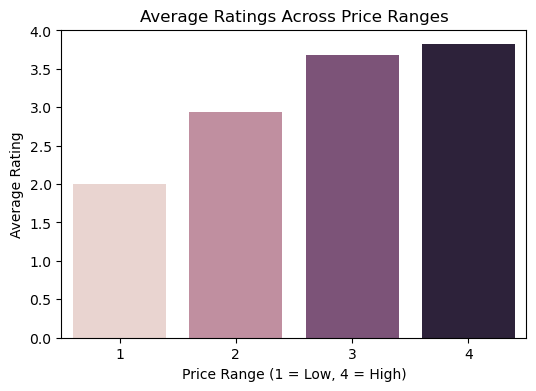

In [131]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.barplot(x=price_range_ratings.index, y=price_range_ratings.values, hue=price_range_ratings.index, dodge=False)

plt.xlabel("Price Range (1 = Low, 4 = High)")
plt.ylabel("Average Rating")
plt.title("Average Ratings Across Price Ranges")
plt.legend([],[], frameon=False) 
plt.show()

In [133]:
# Calculate average rating for each price range
price_range_ratings = df.groupby("Price range")["Aggregate rating"].mean()
highest_rated_price_range = price_range_ratings.idxmax()
print(f"Price range with the highest average rating: {highest_rated_price_range}")

Price range with the highest average rating: 4


In [135]:
# Filter dataset for the highest-rated price range
highest_price_range_df = df[df["Price range"] == highest_rated_price_range]
most_common_color = highest_price_range_df["Rating color"].mode()[0]
print(f"Most common rating color for price range {highest_rated_price_range}: {most_common_color}")

Most common rating color for price range 4: Yellow


In [137]:
#Task 3
df["Restaurant Name Length"] = df["Restaurant Name"].apply(len)
df["Address Length"] = df["Address"].apply(len)
print(df[["Restaurant Name", "Restaurant Name Length", "Address", "Address Length"]].head())

          Restaurant Name  Restaurant Name Length  \
0        Le Petit Souffle                      16   
1        Izakaya Kikufuji                      16   
2  Heat - Edsa Shangri-La                      22   
3                    Ooma                       4   
4             Sambo Kojin                      11   

                                             Address  Address Length  
0  Third Floor, Century City Mall, Kalayaan Avenu...              71  
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...              67  
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...              56  
3  Third Floor, Mega Fashion Hall, SM Megamall, O...              70  
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...              64  


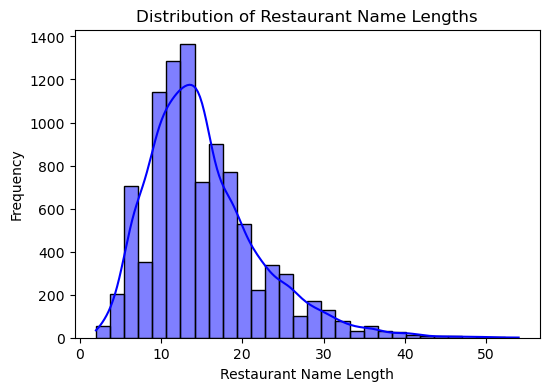

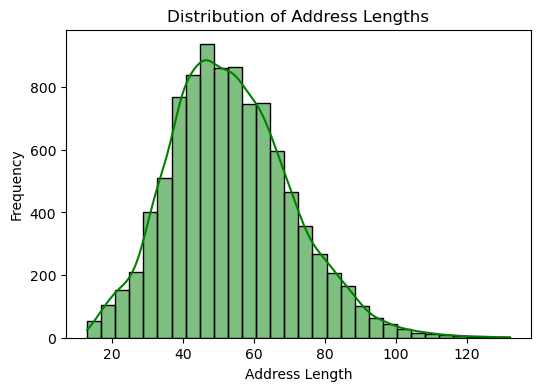

In [139]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.histplot(df["Restaurant Name Length"], bins=30, kde=True, color="blue")
plt.xlabel("Restaurant Name Length")
plt.ylabel("Frequency")
plt.title("Distribution of Restaurant Name Lengths")
plt.show()

plt.figure(figsize=(6, 4))
sns.histplot(df["Address Length"], bins=30, kde=True, color="green")
plt.xlabel("Address Length")
plt.ylabel("Frequency")
plt.title("Distribution of Address Lengths")
plt.show()

Correlation Matrix:
                         Restaurant Name Length  Address Length  \
Restaurant Name Length                1.000000        0.009567   
Address Length                        0.009567        1.000000   
Aggregate rating                     -0.035178        0.002334   

                        Aggregate rating  
Restaurant Name Length         -0.035178  
Address Length                  0.002334  
Aggregate rating                1.000000  


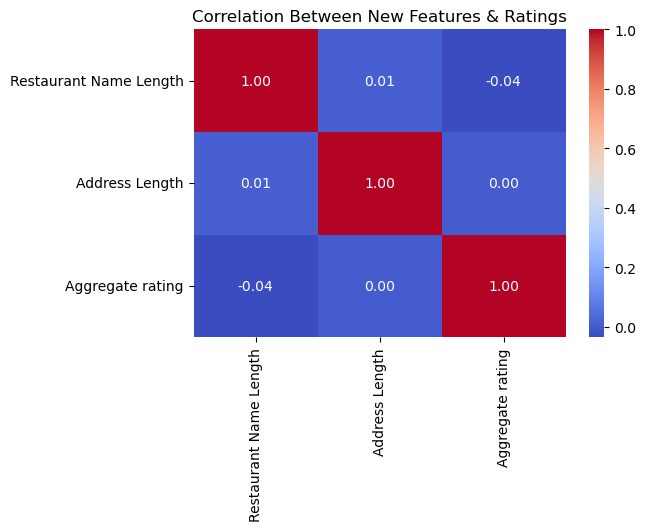

In [140]:
# Check correlation with ratings
correlation = df[["Restaurant Name Length", "Address Length", "Aggregate rating"]].corr()
print("Correlation Matrix:\n", correlation)

# Heatmap to visualize correlation
plt.figure(figsize=(6, 4))
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between New Features & Ratings")
plt.show()

In [144]:
print(df[["Has Table booking", "Has Online delivery"]].isnull().sum())

Has Table booking      0
Has Online delivery    0
dtype: int64


In [145]:
# Fill missing values with "No" (assuming missing values mean service not available)
df["Has Table booking"] = df["Has Table booking"].fillna("No")
df["Has Online delivery"] = df["Has Online delivery"].fillna("No")

In [147]:
df["Has Table Booking"] = df["Has Table booking"].map({"Yes": 1, "No": 0})
df["Has Online Delivery"] = df["Has Online delivery"].map({"Yes": 1, "No": 0})

In [151]:
print(df[["Has Table Booking", "Has Online Delivery"]].head())
print(df[["Has Table Booking", "Has Online Delivery"]].isnull().sum())  # Should return 0

   Has Table Booking  Has Online Delivery
0                NaN                  NaN
1                NaN                  NaN
2                NaN                  NaN
3                NaN                  NaN
4                NaN                  NaN
Has Table Booking      9551
Has Online Delivery    9551
dtype: int64


In [152]:
print(df.columns)

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Restaurant Name Length', 'Address Length',
       'Has Table Booking', 'Has Online Delivery'],
      dtype='object')


In [155]:
df.columns = df.columns.str.strip()  # Remove any leading/trailing spaces
print(df[["Has Table booking", "Has Online delivery"]].isnull().sum())
print(df["Has Table booking"].unique())
print(df["Has Online delivery"].unique())

Has Table booking      0
Has Online delivery    0
dtype: int64
[1 0]
[0 1]


In [157]:
# Standardize text formatting (remove spaces & lowercase)
df["Has Table booking"] = df["Has Table booking"].astype(str).str.strip().str.lower()
df["Has Online delivery"] = df["Has Online delivery"].astype(str).str.strip().str.lower()

# Fill missing values with "no"
df["Has Table booking"].fillna("no", inplace=True)
df["Has Online delivery"].fillna("no", inplace=True)

# Map "yes" -> 1 and "no" -> 0
df["Has Table Booking"] = df["Has Table booking"].map({"yes": 1, "no": 0})
df["Has Online Delivery"] = df["Has Online delivery"].map({"yes": 1, "no": 0})

# Verify if mapping worked
print(df[["Has Table Booking", "Has Online Delivery"]].head())
print(df[["Has Table Booking", "Has Online Delivery"]].isnull().sum()) 

   Has Table Booking  Has Online Delivery
0                NaN                  NaN
1                NaN                  NaN
2                NaN                  NaN
3                NaN                  NaN
4                NaN                  NaN
Has Table Booking      9551
Has Online Delivery    9551
dtype: int64


C:\Users\user\AppData\Local\Temp\ipykernel_4000\1548990315.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Has Table booking"].fillna("no", inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_4000\1548990315.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For examp

In [159]:
print("Total rows in dataset before filtering:", len(df))

Total rows in dataset before filtering: 9551


In [188]:
# Level 3
# Task 1

df= pd.read_csv("C:\\Users\\user\\Downloads\\train.csv")

In [190]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [192]:
num_rows, num_columns = df.shape
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}") 

Number of Rows: 7560
Number of Columns: 21


In [194]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,7.560000e+03,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000
mean,8.749795e+06,16.276190,63.123253,26.507853,601.356217,1.798545,2.716495,167.808201
std,8.877779e+06,54.338577,43.774638,8.868731,634.127544,0.899661,1.483311,465.513132
min,5.300000e+01,1.000000,-157.948486,-38.634746,0.000000,1.000000,0.000000,0.000000
25%,3.008432e+05,1.000000,77.081856,28.479139,250.000000,1.000000,2.600000,6.000000
50%,2.500122e+06,1.000000,77.176937,28.573253,450.000000,2.000000,3.200000,32.000000
75%,1.833797e+07,1.000000,77.237552,28.649003,700.000000,2.000000,3.700000,134.000000
max,1.850065e+07,216.000000,153.593331,52.008289,8000.000000,4.000000,4.900000,10934.000000


In [196]:
df= pd.read_csv("C:\\Users\\user\\Downloads\\Test.csv")

In [180]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,New Delhi,"A-31, Vishnu Garden, Khyala Road, Tilak Nagar,...",Tilak Nagar,"Tilak Nagar, New Delhi",77.103341,28.648730,"Fast Food, Bakery",350,Indian Rupees(Rs.),No,...,No,No,1,2.9,Orange,Average,21,NaN,NaN,NaN
1,New Delhi,"11/41B, Gurudwara Road, Tilak Nagar Market, Ti...",Tilak Nagar,"Tilak Nagar, New Delhi",77.095508,28.640040,"North Indian, Fast Food, Afghani",300,Indian Rupees(Rs.),No,...,No,No,1,3.0,Orange,Average,4,NaN,NaN,NaN
2,New Delhi,"44/1, Totaram Ahuja Marg, Ashok Nagar, Tilak N...",Tilak Nagar,"Tilak Nagar, New Delhi",77.099839,28.635043,Fast Food,300,Indian Rupees(Rs.),No,...,No,No,1,2.9,Orange,Average,5,NaN,NaN,NaN
3,New Delhi,"179, Mukherji Park, Vishnu Garden, Tilak Nagar...",Tilak Nagar,"Tilak Nagar, New Delhi",77.104021,28.643714,"Raw Meats, North Indian, Fast Food",350,Indian Rupees(Rs.),No,...,No,No,1,3.0,Orange,Average,6,NaN,NaN,NaN
4,New Delhi,"A-132, Ganesh Nagar, Tilak Nagar, New Delhi",Tilak Nagar,"Tilak Nagar, New Delhi",77.090590,28.636455,"Raw Meats, North Indian, Fast Food",350,Indian Rupees(Rs.),No,...,No,No,1,3.2,Orange,Average,16,NaN,NaN,NaN


In [184]:
num_rows, num_columns = df.shape
print(f"Number of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}") 

Number of Rows: 1991
Number of Columns: 21


In [152]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [154]:
# Load train and test datasets
train_df = pd.read_csv("C:\\Users\\user\\Downloads\\train.csv")
test_df = pd.read_csv("C:\\Users\\user\\Downloads\\Test.csv")

# Inspect first few rows
print("Train Dataset Preview:\n", train_df.head())
print("\nTest Dataset Preview:\n", test_df.head())

Train Dataset Preview:
    Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandal

In [156]:
print("Train Dataset Columns:\n", train_df.columns)
print("\nTest Dataset Columns:\n", test_df.columns)

Train Dataset Columns:
 Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

Test Dataset Columns:
 Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


In [158]:
# Create 'Cuisine Popularity' by counting frequency of each cuisine
train_df['Cuisine Popularity'] = train_df['Cuisines'].map(train_df['Cuisines'].value_counts())
test_df['Cuisine Popularity'] = test_df['Cuisines'].map(test_df['Cuisines'].value_counts())

In [160]:
print(train_df[['Cuisines', 'Cuisine Popularity']].head())
print(test_df[['Cuisines', 'Cuisine Popularity']].head())

                           Cuisines  Cuisine Popularity
0        French, Japanese, Desserts                 1.0
1                          Japanese                16.0
2  Seafood, Asian, Filipino, Indian                 1.0
3                   Japanese, Sushi                15.0
4                  Japanese, Korean                 3.0
  Cuisines  Cuisine Popularity
0       No                1824
1       No                1824
2       No                1824
3       No                1824
4       No                1824


In [162]:
# Define feature columns and target variable
features = ["Has Table booking", "Has Online delivery", "Price range", "Votes", "Cuisine Popularity"]
target = "Aggregate rating"

# Split train and test sets
X_train = train_df[features]
y_train = train_df[target]

X_test = test_df[features]
y_test = test_df[target]

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)


X_train shape: (7560, 5)
X_test shape: (1991, 5)


In [164]:
print(X_train.dtypes)
print(X_train.select_dtypes(include=['object']).head())

Has Table booking       object
Has Online delivery     object
Price range              int64
Votes                    int64
Cuisine Popularity     float64
dtype: object
  Has Table booking Has Online delivery
0               Yes                  No
1               Yes                  No
2               Yes                  No
3                No                  No
4               Yes                  No


In [166]:
# Check for missing values in categorical columns
print(X_train[["Has Table booking", "Has Online delivery"]].isnull().sum())
print(X_test[["Has Table booking", "Has Online delivery"]].isnull().sum())

Has Table booking      0
Has Online delivery    0
dtype: int64
Has Table booking      0
Has Online delivery    0
dtype: int64


In [168]:
# Inspect the columns causing the issue
print("Train - 'Has Table booking' Unique Values:\n", X_train["Has Table booking"].unique())
print("Train - 'Has Online delivery' Unique Values:\n", X_train["Has Online delivery"].unique())

# Check for any unexpected data types
print("\nData Types:\n", X_train[["Has Table booking", "Has Online delivery"]].dtypes)

# Check for NaNs explicitly
print("\nNaN Count in Train Set:\n", X_train[["Has Table booking", "Has Online delivery"]].isnull().sum())

Train - 'Has Table booking' Unique Values:
 ['Yes' 'No']
Train - 'Has Online delivery' Unique Values:
 ['No' 'Yes']

Data Types:
 Has Table booking      object
Has Online delivery    object
dtype: object

NaN Count in Train Set:
 Has Table booking      0
Has Online delivery    0
dtype: int64


In [170]:
# Coerce non-numeric values to NaN safely using .loc
X_train.loc[:, "Has Table booking"] = pd.to_numeric(X_train.loc[:, "Has Table booking"], errors='coerce')
X_test.loc[:, "Has Table booking"] = pd.to_numeric(X_test.loc[:, "Has Table booking"], errors='coerce')

X_train.loc[:, "Has Online delivery"] = pd.to_numeric(X_train.loc[:, "Has Online delivery"], errors='coerce')
X_test.loc[:, "Has Online delivery"] = pd.to_numeric(X_test.loc[:, "Has Online delivery"], errors='coerce')

In [190]:
# Fill NaNs with 0 using .loc to avoid the warning
X_train.loc[:, "Has Table booking"] = X_train.loc["Has Table booking"].fillna(0).astype(int)
X_test.loc[:, "Has Table booking"] = X_test.loc["Has Table booking"].fillna(0).astype(int)

X_train.loc[:, "Has Online delivery"] = X_train.loc["Has Online delivery"].fillna(0).astype(int)
X_test.loc[:, "Has Online delivery"] = X_test.loc["Has Online delivery"].fillna(0).astype(int)

KeyError: 'Has Table booking'

In [174]:
# Final verification
print("\nFinal Verification:")
print(X_train[["Has Table booking", "Has Online delivery"]].info())
print(X_train[["Has Table booking", "Has Online delivery"]].head())


Final Verification:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7560 entries, 0 to 7559
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Has Table booking    7560 non-null   object
 1   Has Online delivery  7560 non-null   object
dtypes: object(2)
memory usage: 118.3+ KB
None
  Has Table booking Has Online delivery
0                 0                   0
1                 0                   0
2                 0                   0
3                 0                   0
4                 0                   0


In [176]:
# Check data types of all columns
print(X_test.dtypes)

# Check for non-numeric values
print("\nNon-numeric columns:")
print(X_test.select_dtypes(include=['object']).columns)

# Check for unexpected string values
print("\nUnique values in each column:")
for col in X_test.columns:
    print(f"{col}: {X_test[col].unique()}")

Has Table booking       object
Has Online delivery      int64
Price range             object
Votes                  float64
Cuisine Popularity       int64
dtype: object

Non-numeric columns:
Index(['Has Table booking', 'Price range'], dtype='object')

Unique values in each column:
Has Table booking: [0]
Has Online delivery: [1 2 3 4]
Price range: ['Average' 'Good' 'Not rated' 'Very Good' 'Poor' 'Excellent']
Votes: [nan]
Cuisine Popularity: [1824  167]


In [178]:
X_test.loc[:, "Price range"] = pd.to_numeric(X_test.loc[:, "Price range"], errors='coerce')
X_test.loc[:, "Votes"] = pd.to_numeric(X_test.loc[:, "Votes"], errors='coerce')
X_test.loc[:, "Cuisine Popularity"] = pd.to_numeric(X_test.loc[:, "Cuisine Popularity"], errors='coerce')

# Fill NaN values with 0
X_test.loc[:, :] = X_test.fillna(0)

C:\Users\user\AppData\Local\Temp\ipykernel_14148\276217830.py:6: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X_test.loc[:, :] = X_test.fillna(0)


In [180]:
print(X_test.dtypes)
print("\nCheck for remaining NaNs:", X_test.isnull().sum())

Has Table booking       object
Has Online delivery      int64
Price range             object
Votes                  float64
Cuisine Popularity       int64
dtype: object

Check for remaining NaNs: Has Table booking      0
Has Online delivery    0
Price range            0
Votes                  0
Cuisine Popularity     0
dtype: int64


In [182]:
# Initialize scaler
scaler = StandardScaler()

# Scale the train and test datasets
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [184]:
# Function to train and evaluate models
def train_and_evaluate(model, X_train, X_test, y_train, y_test, model_name):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate performance metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Print results
    print(f"\n {model_name} Performance:")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"R-squared Score (R²): {r2:.2f}")
    
    return (mae, rmse, r2)

In [192]:
# Check for missing values
print("Missing values in X_train:")
print(X_train.isnull().sum())

print("\nMissing values in X_test:")
print(X_test.isnull().sum())

Missing values in X_train:
Has Table booking      0
Has Online delivery    0
Price range            0
Votes                  0
Cuisine Popularity     9
dtype: int64

Missing values in X_test:
Has Table booking      0
Has Online delivery    0
Price range            0
Votes                  0
Cuisine Popularity     0
dtype: int64


In [194]:
# Fill missing values with 0 (or mean/median if appropriate)
X_train.fillna(0, inplace=True)
X_test.fillna(0, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_14148\3931655580.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.fillna(0, inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_14148\3931655580.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.fillna(0, inplace=True)


In [196]:
# Drop rows with missing values
X_train.dropna(inplace=True)
X_test.dropna(inplace=True)
y_train = y_train.loc[X_train.index]
y_test = y_test.loc[X_test.index]

C:\Users\user\AppData\Local\Temp\ipykernel_14148\3541637387.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.dropna(inplace=True)
C:\Users\user\AppData\Local\Temp\ipykernel_14148\3541637387.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test.dropna(inplace=True)


In [198]:
# Confirm no missing values are left
print("\nX_train missing values after cleaning:\n", X_train.isnull().sum())
print("\nX_test missing values after cleaning:\n", X_test.isnull().sum())


X_train missing values after cleaning:
 Has Table booking      0
Has Online delivery    0
Price range            0
Votes                  0
Cuisine Popularity     0
dtype: int64

X_test missing values after cleaning:
 Has Table booking      0
Has Online delivery    0
Price range            0
Votes                  0
Cuisine Popularity     0
dtype: int64


In [200]:
# Re-scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Re-run Linear Regression
results["Linear Regression"] = train_and_evaluate(
    linear_model, X_train_scaled, X_test_scaled, y_train, y_test, "Linear Regression"
)


 Linear Regression Performance:
Mean Absolute Error (MAE): 115.67
Mean Squared Error (MSE): 76021.72
Root Mean Squared Error (RMSE): 275.72
R-squared Score (R²): -0.21


In [203]:
# Initialize the models
decision_tree = DecisionTreeRegressor(random_state=42)
random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
results = {}

In [205]:
# Decision Tree (Unscaled Data)
results["Decision Tree"] = train_and_evaluate(
    decision_tree, X_train, X_test, y_train, y_test, "Decision Tree Regressor"
)
# Random Forest (Unscaled Data)
results["Random Forest"] = train_and_evaluate(
    random_forest, X_train, X_test, y_train, y_test, "Random Forest Regressor"
)


 Decision Tree Regressor Performance:
Mean Absolute Error (MAE): 115.53
Mean Squared Error (MSE): 76040.15
Root Mean Squared Error (RMSE): 275.75
R-squared Score (R²): -0.21

 Random Forest Regressor Performance:
Mean Absolute Error (MAE): 115.53
Mean Squared Error (MSE): 76040.15
Root Mean Squared Error (RMSE): 275.75
R-squared Score (R²): -0.21



🔍 Model Performance Comparison:

                      MAE        RMSE        R²
Decision Tree  115.527373  275.753782 -0.212886
Random Forest  115.527373  275.753782 -0.212886


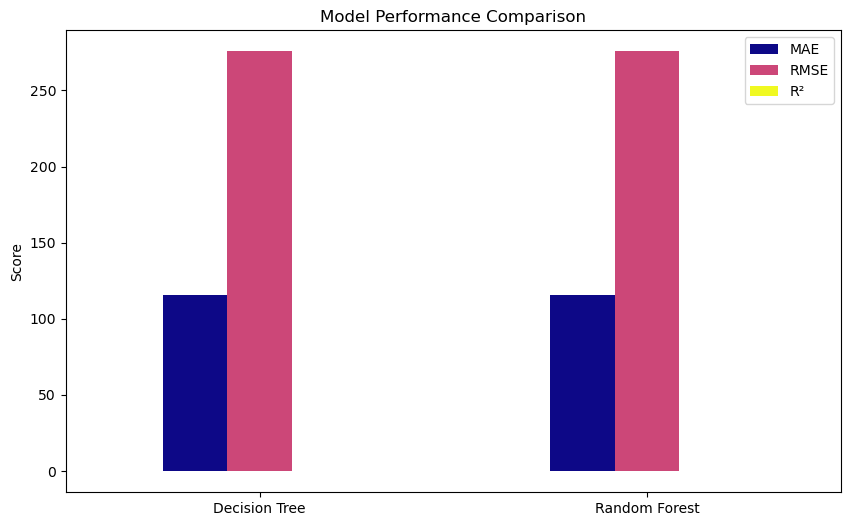

In [207]:
# Convert results to a DataFrame
results_df = pd.DataFrame(results, index=["MAE", "RMSE", "R²"]).T

# Print the comparison
print("\n🔍 Model Performance Comparison:\n")
print(results_df)

# Plot the comparison
results_df.plot(kind='bar', figsize=(10, 6), colormap='plasma')
plt.title("Model Performance Comparison")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.show()

In [ ]:
#Level 2 


In [216]:
import pandas as pd
df = pd.read_csv("C:\\Users\\user\\Downloads\\Dataset .csv")

In [218]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Top 10 Cuisines by Average Rating:

Cuisine
Sunda         4.900000
B�_rek        4.700000
Taiwanese     4.650000
Ramen         4.500000
Dim Sum       4.466667
Hawaiian      4.412500
D�_ner        4.400000
Bubble Tea    4.400000
Curry         4.400000
Kebab         4.380000
Name: Aggregate rating, dtype: float64


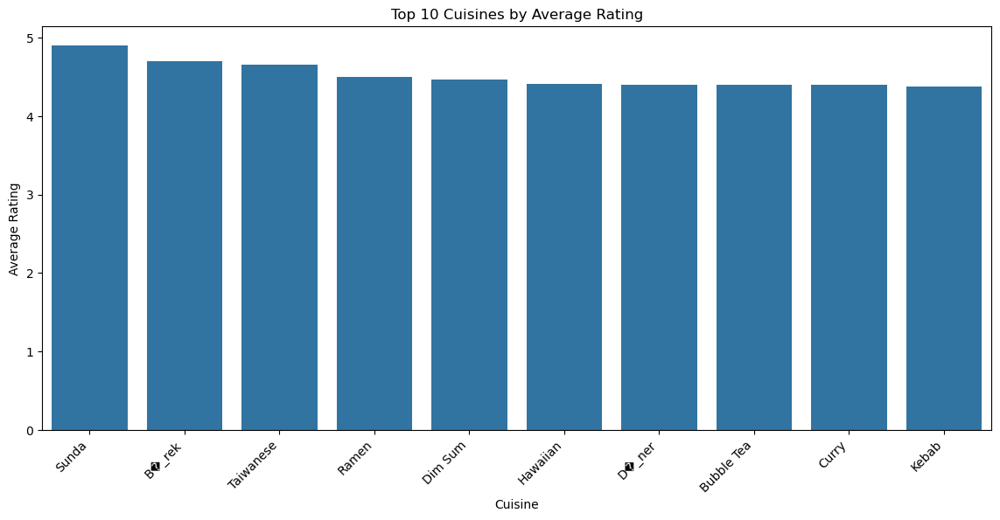

In [235]:
# Split cuisines into multiple rows (if multiple cuisines are listed)
df_exploded = df.copy()
df_exploded['Cuisine'] = df_exploded['Cuisines'].str.split(", ")
df_exploded = df_exploded.explode('Cuisine')

# Group by cuisine to check the average rating
cuisine_ratings = df_exploded.groupby("Cuisine")["Aggregate rating"].mean().sort_values(ascending=False)

# Display top 10 cuisines by average rating
print("Top 10 Cuisines by Average Rating:\n")
print(cuisine_ratings.head(10))

# Plot the top 10 cuisines by average rating
plt.figure(figsize=(14, 6))
sns.barplot(
    x=cuisine_ratings.head(10).index,
    y=cuisine_ratings.head(10).values
)
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Cuisines by Average Rating")
plt.xlabel("Cuisine")
plt.ylabel("Average Rating")
plt.show()

In [228]:
# Split cuisines into multiple rows (if multiple cuisines are listed)
df_exploded = df.copy()
df_exploded['Cuisine'] = df_exploded['Cuisines'].str.split(", ")
df_exploded = df_exploded.explode('Cuisine')

# Group by cuisine to check the total votes
cuisine_votes = df_exploded.groupby("Cuisine")["Votes"].sum().sort_values(ascending=False)

# Display the top 10 cuisines by total votes
print("\nTop 10 Cuisines by Total Votes:\n")
print(cuisine_votes.head(10))


Top 10 Cuisines by Total Votes:

Cuisine
North Indian    595981
Chinese         364351
Italian         329265
Continental     288255
Fast Food       184058
American        183117
Cafe            177568
Mughlai         151946
Desserts        105889
Asian           104303
Name: Votes, dtype: int64



Top 10 Popular Cuisines with Highest Ratings (Votes > 500):

        Cuisine  Average Rating  Total Votes
130       Sunda        4.900000         5514
26       B�_rek        4.700000         1305
112       Ramen        4.500000         1259
43      Dim Sum        4.466667         1755
61     Hawaiian        4.412500         8012
23   Bubble Tea        4.400000          659
40        Curry        4.400000         2059
75        Kebab        4.380000         1536
71       Izgara        4.350000         1166
50     Filipino        4.340000         3789


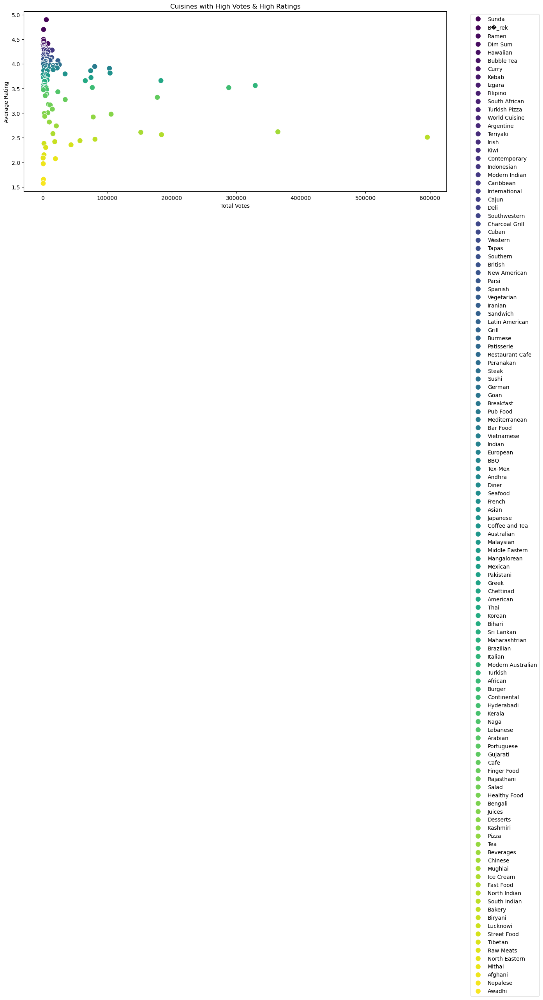

In [230]:
# Combine both datasets for holistic analysis
cuisine_analysis = pd.DataFrame({
    "Average Rating": cuisine_ratings, 
    "Total Votes": cuisine_votes         
}).reset_index()

# Sort by highest ratings with at least 500 votes to avoid small sample bias
popular_high_rating = cuisine_analysis[cuisine_analysis["Total Votes"] > 500].sort_values(by="Average Rating", ascending=False)

# Display top 10 high-rated popular cuisines
print("\nTop 10 Popular Cuisines with Highest Ratings (Votes > 500):\n")
print(popular_high_rating.head(10))

# Plot the result
plt.figure(figsize=(14, 6))
sns.scatterplot(x="Total Votes", y="Average Rating", data=popular_high_rating, hue="Cuisine", palette="viridis", s=100)
plt.title("Cuisines with High Votes & High Ratings")
plt.xlabel("Total Votes")
plt.ylabel("Average Rating")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [ ]:
#Level 3

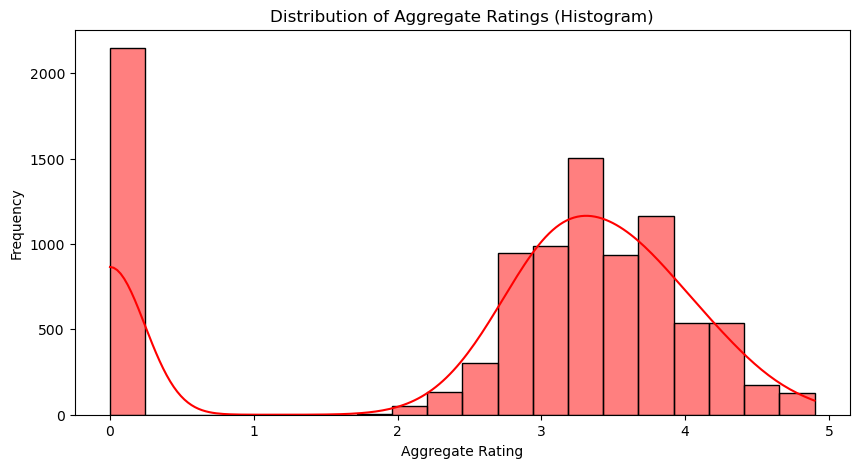

In [244]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot Histogram
plt.figure(figsize=(10, 5))
sns.histplot(df["Aggregate rating"], bins=20, kde=True, color="red")
plt.title("Distribution of Aggregate Ratings (Histogram)")
plt.xlabel("Aggregate Rating")
plt.ylabel("Frequency")
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_14148\3211022758.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rating_counts.index, y=rating_counts.values, palette="viridis")


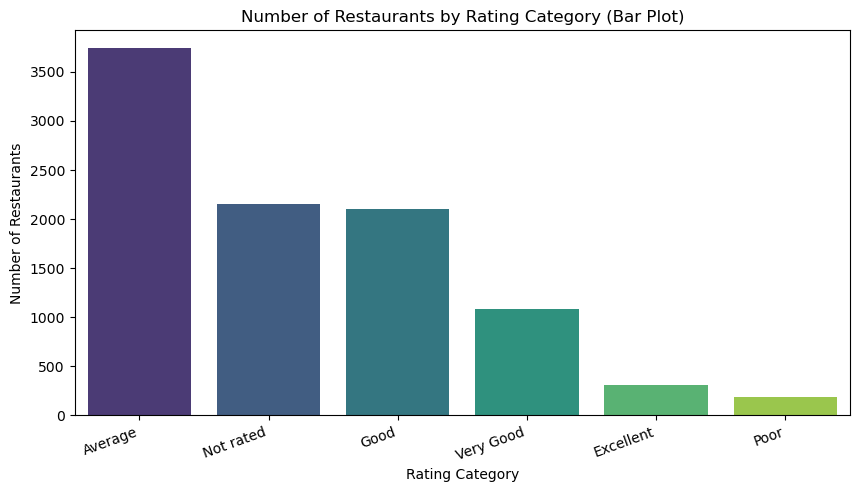

In [246]:
# Count of each rating text category
rating_counts = df["Rating text"].value_counts()

# Plot Bar Chart
plt.figure(figsize=(10, 5))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette="viridis")
plt.title("Number of Restaurants by Rating Category (Bar Plot)")
plt.xlabel("Rating Category")
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=20, ha="right")
plt.show()

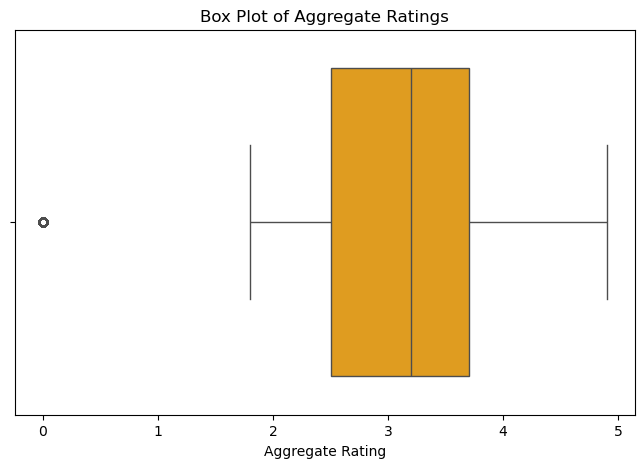

In [248]:
# Plot Box Plot
plt.figure(figsize=(8, 5))
sns.boxplot(x=df["Aggregate rating"], color="orange")
plt.title("Box Plot of Aggregate Ratings")
plt.xlabel("Aggregate Rating")
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_14148\3935784931.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=df["Aggregate rating"], inner="quartile", palette="muted")


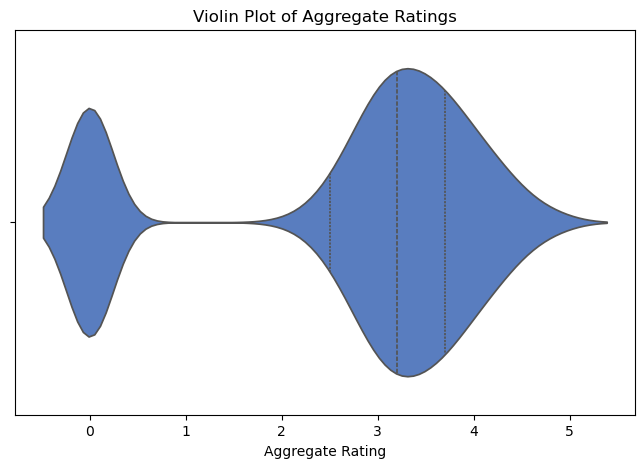

In [250]:
# Plot Violin Plot
plt.figure(figsize=(8, 5))
sns.violinplot(x=df["Aggregate rating"], inner="quartile", palette="muted")
plt.title("Violin Plot of Aggregate Ratings")
plt.xlabel("Aggregate Rating")
plt.show()

In [252]:
'''
Insights to Look For:
Histogram: Shows the overall distribution and skewness of ratings.

Bar Plot: Shows how many restaurants fall into each rating category.

Box Plot: Reveals the spread and outliers in ratings.

Violin Plot: Provides a combination of distribution and quartiles. 
'''

'\nInsights to Look For:\nHistogram: Shows the overall distribution and skewness of ratings.\n\nBar Plot: Shows how many restaurants fall into each rating category.\n\nBox Plot: Reveals the spread and outliers in ratings.\n\nViolin Plot: Provides a combination of distribution and quartiles. \n'


Top 10 Cities by Average Rating:

City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Tagaytay City       4.500000
Secunderabad        4.500000
Name: Aggregate rating, dtype: float64


C:\Users\user\AppData\Local\Temp\ipykernel_14148\1525463323.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


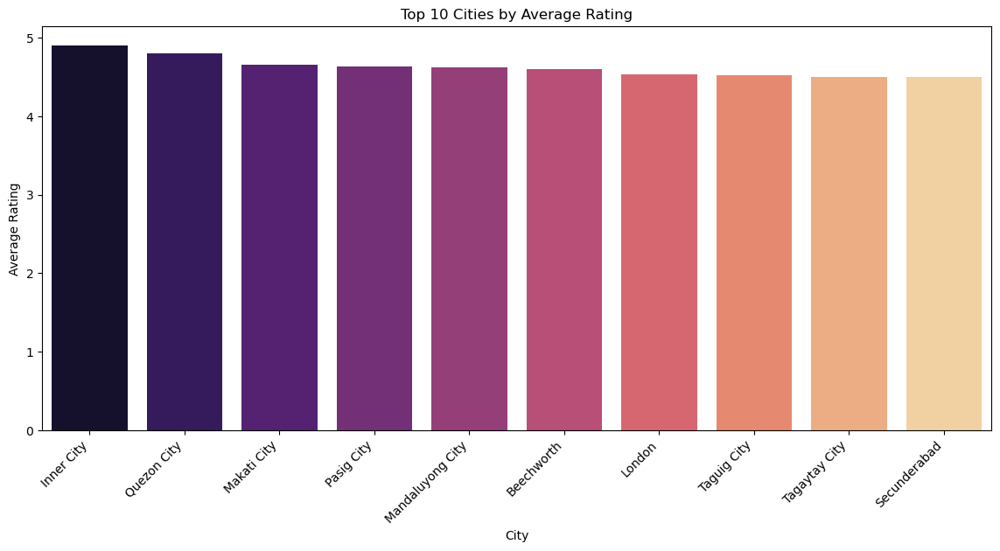

In [254]:
# Group by city to calculate average rating
city_avg_ratings = df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False)

# Top 10 cities with highest average ratings
print("\nTop 10 Cities by Average Rating:\n")
print(city_avg_ratings.head(10))

# Bar Plot for Top 10 Cities
plt.figure(figsize=(14, 6))
sns.barplot(
    x=city_avg_ratings.head(10).index,
    y=city_avg_ratings.head(10).values,
    palette="magma"
)
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Cities by Average Rating")
plt.xlabel("City")
plt.ylabel("Average Rating")
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_14148\4094850566.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="City", y="Aggregate rating", data=df[df["City"].isin(top_10_cities)], palette="viridis")


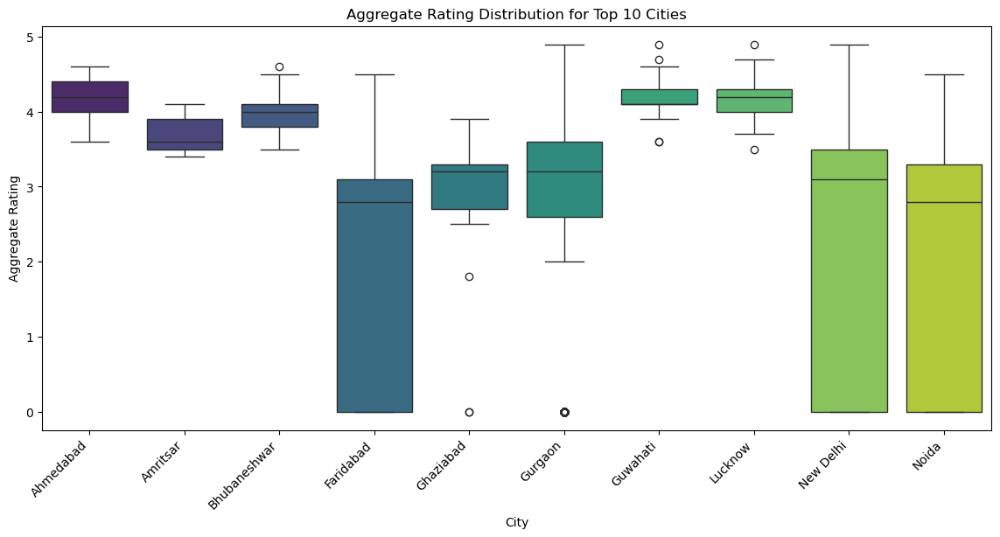

In [260]:
# Box plot for rating distribution by top 10 cities
top_10_cities = df['City'].value_counts().head(10).index
plt.figure(figsize=(14, 6))
sns.boxplot(x="City", y="Aggregate rating", data=df[df["City"].isin(top_10_cities)], palette="viridis")
plt.title("Aggregate Rating Distribution for Top 10 Cities")
plt.xlabel("City")
plt.ylabel("Aggregate Rating")
plt.xticks(rotation=45, ha="right")
plt.show()

In [269]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Has_Online_delivery', y='Aggregate_rating', data=df, palette='Set2')
plt.title('Online Delivery vs. Ratings')
plt.xlabel('Has Online Delivery')
plt.ylabel('Aggregate Rating')
plt.show()

ValueError: Could not interpret value `Has_Online_delivery` for `x`. An entry with this name does not appear in `data`.

<Figure size 800x600 with 0 Axes>